In [1]:
%%bash
sudo apt install tesseract-ocr
sudo apt install libtesseract-dev

Reading package lists...
Building dependency tree...
Reading state information...
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
Reading package lists...
Building dependency tree...
Reading state information...
libtesseract-dev is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [2]:
# from google.colab import drive
# drive.mount('/gdrive')
!pip install "layoutparser[paddledetection]"
!pip install "layoutparser[ocr]"
!!pip install pytesseract

['Requirement already satisfied: pytesseract in /usr/local/lib/python3.7/dist-packages (0.3.8)',
 'Requirement already satisfied: Pillow in /usr/local/lib/python3.7/dist-packages (from pytesseract) (7.1.2)']

In [3]:

!pip install "layoutparser[layoutmodels]" # Install DL layout model toolkit 
!pip install "layoutparser[ocr]" # Install OCR toolkit

In [4]:
import paddle.fluid 

paddle.fluid.install_check.run_check()

Running Verify Fluid Program ... 
Your Paddle Fluid works well on SINGLE GPU or CPU.
Your Paddle Fluid works well on MUTIPLE GPU or CPU.
Your Paddle Fluid is installed successfully! Let's start deep Learning with Paddle Fluid now


In [5]:
!pip install layoutparser
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [6]:
!unzip -f /content/document_layout_analysis.zip

Archive:  /content/document_layout_analysis.zip


In [7]:
import cv2
import layoutparser as lp

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import os, json, cv2, random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

in colab:
before running the cell below, put **ben.traineddata** file in this directory : /usr/share/tesseract-ocr/4.00/tessdata/ben.traineddata

you can download the data from here : https://github.com/tesseract-ocr/tessdata/blob/main/ben.traineddata

In [8]:
def text_inside_figure(text_blocks,image):
    h, w = image.shape[:2]

    left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)

    left_blocks = text_blocks.filter_by(left_interval, center=True)
    left_blocks.sort(key = lambda b:b.coordinates[1])

    right_blocks = [b for b in text_blocks if b not in left_blocks]
    right_blocks.sort(key = lambda b:b.coordinates[1])
    text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])
    return text_blocks

In [9]:
def bengali_doc_layout_parser(image_path = "/content/benlayout.jpg",model_name = 'efficientdet'):
    
    '''
      ref : 
      1. https://arxiv.org/pdf/2103.15348.pdf
      2. https://github.com/Layout-Parser/layout-parser/blob/master/docs/example/deep_layout_parsing/index.rst
    '''
    print(image_path)
    figure(figsize=(10, 10), dpi=90)
    try:
      image = cv2.imread(image_path)
      image = image[..., ::-1]
    except:
      print("An exception occurred,unable to read input image.\n")
      return
    if(model_name == 'Detectron2'):
        model = lp.Detectron2LayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config',
                                      extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
                                      label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})
    elif(model_name == 'efficientdet'):
        model = lp.AutoLayoutModel("lp://efficientdet/PubLayNet")
        #model = lp.AutoLayoutModel("lp://efficientdet/PubLayNet/tf_efficientdet_d1")
    else:
      print("unknown model,supported models: \n 1.Detectron2 \n 2.efficientdet\n")
      return
     

    # model = lp.models.PaddleDetectionLayoutModel('lp://paddledetection/PubLayNet')

    #print(model)

    layout = model.detect(image)
    color_map = {
    'Text': 'red',
    'Title': 'blue',
    'List': 'green',
    'Table': 'purple',
    'Figure': 'pink',
    }
    print("\n\ncolor_map : \n\n",color_map)
    plt.imshow(lp.draw_box(image, layout, box_width=3, color_map=color_map))
    plt.show()
    figure(figsize=(10, 10), dpi=90)
    print(layout[0])
    text_blocks1 = lp.Layout([b for b in layout if b.type=='Text'])
    figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])

    #As there could be text region detected inside the figure region, we just drop them:
    
    text_blocks = lp.Layout([b for b in text_blocks1 \
                      if not any(b.is_in(b_fig) for b_fig in figure_blocks)])
    
    h, w = image.shape[:2]

    left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)

    left_blocks = text_blocks.filter_by(left_interval, center=True)
    left_blocks.sort(key = lambda b:b.coordinates[1])

    right_blocks = [b for b in text_blocks if b not in left_blocks]
    right_blocks.sort(key = lambda b:b.coordinates[1])

    # And finally combine the two list and add the index
    # according to the order
    text_blocks2 = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])

    print("\nplotting only text_blocks : \n\n")
    if(len(text_blocks2)<1):
      print("Bengali DLU failed on this image(probably text inside figure??)...")
      text_blocks = text_inside_figure(text_blocks1,image)
    else:
      text_blocks = text_blocks2
    plt.imshow(lp.draw_box(image, text_blocks,
                box_width=3, 
                show_element_id=True))
    plt.show()
    ocr_agent = lp.TesseractAgent(languages='eng+ben') 
    for block in text_blocks:
        segment_image = (block
                          .pad(left=5, right=5, top=5, bottom=5)
                          .crop_image(image))
            # add padding in each image segment can help
            # improve robustness 
            
        text = ocr_agent.detect(segment_image)
        block.set(text=text, inplace=True)

    for txt in text_blocks.get_texts():
        print(txt, end='\n---\n')

In [10]:
test_images= [
               '/content/document_layout_analysis/random/bangladoc.png',
               '/content/document_layout_analysis/random/banglalayout.jpg',
               '/content/document_layout_analysis/random/bengood.jpg',
               '/content/document_layout_analysis/random/benlayout.jpg',
               '/content/document_layout_analysis/random/benpaper.png',
               '/content/document_layout_analysis/random/cashmemo.png',
               '/content/document_layout_analysis/random/testing.png', #english
             
               
               '/content/document_layout_analysis/sushmit_bhai/1.png',
               '/content/document_layout_analysis/sushmit_bhai/2.png',
               '/content/document_layout_analysis/sushmit_bhai/3.png',
               '/content/document_layout_analysis/sushmit_bhai/4.png',
               '/content/document_layout_analysis/sushmit_bhai/5.png',
               '/content/document_layout_analysis/sushmit_bhai/6.png',
               '/content/document_layout_analysis/sushmit_bhai/image.png',
               '/content/document_layout_analysis/sushmit_bhai/image1.png',
               '/content/document_layout_analysis/sushmit_bhai/image2.png'
]

# efficientdet

/content/document_layout_analysis/random/bangladoc.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


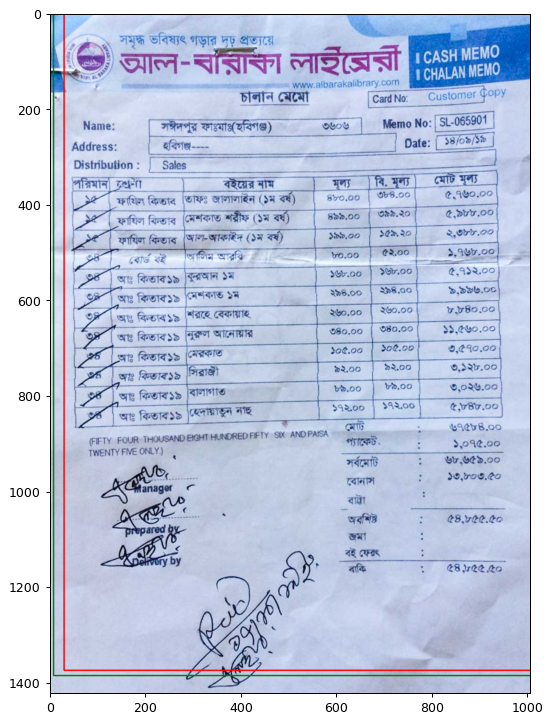

TextBlock(block=Rectangle(x_1=7.889206409454346, y_1=0.0, x_2=1006.0000462532043, y_2=1386.5255126953125), text=None, id=0, type=Table, parent=None, next=None, score=0.6084499955177307)

plotting only text_blocks : 




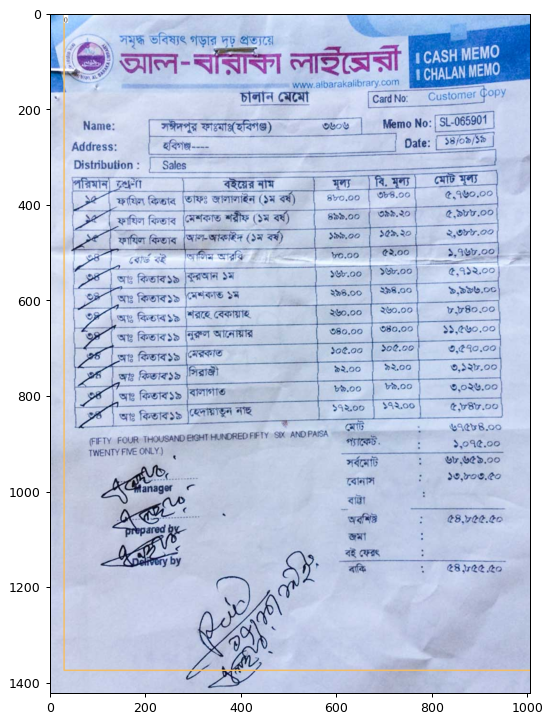

 

Sa wt

ow www.albarakalibrary.com

[CardNo: | Customer t

 
 

       

Pre inh une
1

   

০6%

 

 

 

 

 

 

 

 

 

 

 

 

 

 

  

 

 

 

 
 
  

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

 

Name: ile ae Memo No: | SL-065901 |
Address: Par ] 036: [25৯]
Distribution: | Sales ]

I ct 7]
৷ ফাযিল কিতাব fers: জালালাইন (১ম বর্ষ) 840.00 ed | ee
| মেশকাত শরীফ (১ম বর্ষ Seno | তাহত ৫:৯৮৮.০০
'আপ-আকহিদ (১ম বর্ষ) ভচভভাচতমহচ |  ফুতচদ৮০০
দিম আরবি ৮০.০০ 3.00 | ১,৭৬৮:০০,
আঃ কিতাব১৯ কুরআন ১ম EE yuv.00 ] ১৬৮.০০ এজ সপ -
আঃ কিতাব ১৯ মেশকাত চন ২৯৪.০০ 33800 | ৬৯.৯৯৬.০০
অঅ Rose শরহে. বেকায়াহ ২৬০,০০ | 20.00 ৮:৮৪০.০০
আট কিতাব১৯ [নুরুল আনোয়ার ৩৪০.০০ [ ৩৪০.০০ ১১,৫৬০.০০
আঃ কিতাব ১৯ |মনেরকাত ১6৫০০ | ১০৫.০০ 0,040.00
আঃ কিতাব'১৯ ৯২০০ ৷ ৯২০০ ৩,১২৮.০০
আঃ কিতাব ১৯ |বালাগাত চক,০০ [৮৯:০০ | ৩,০২৬.০০
আঃ কিতাব ১৯ 'হেদায়াতুন নাছ ১৭২.০০ সম্মত] ৫:৮৪৮.০০
(FIFTY. FOUR: THOUSAND EXGHT/HUNDRED FIFTY SX cmnaneenassh মোট ৬৭৫৮৪.০০
TWENTY FIVE ONLY) প্যাকেট. ১,০৭৫.০০
সর্বমোট ৬৮,৬৫৯.০০
বোনাস ১৩,৮৩৩.

/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


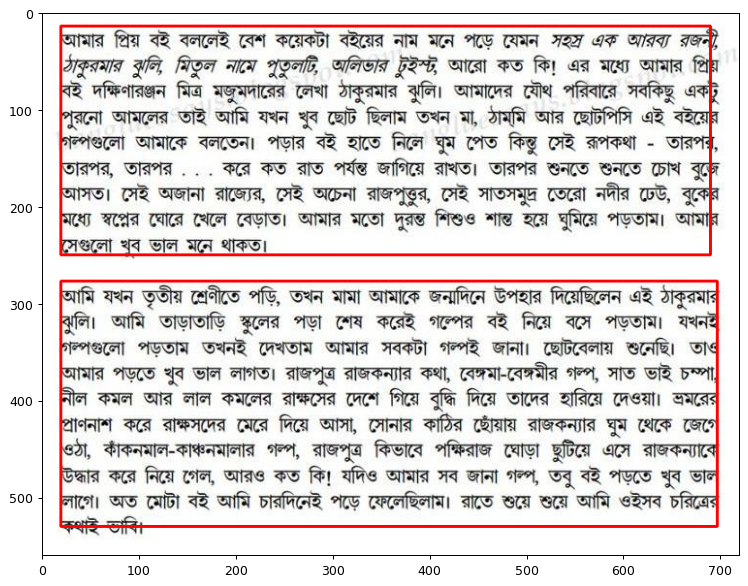

TextBlock(block=Rectangle(x_1=19.014436721801758, y_1=277.9214782714844, x_2=696.9064655303955, y_2=530.9724731445312), text=None, id=0, type=Text, parent=None, next=None, score=0.9136387705802917)

plotting only text_blocks : 




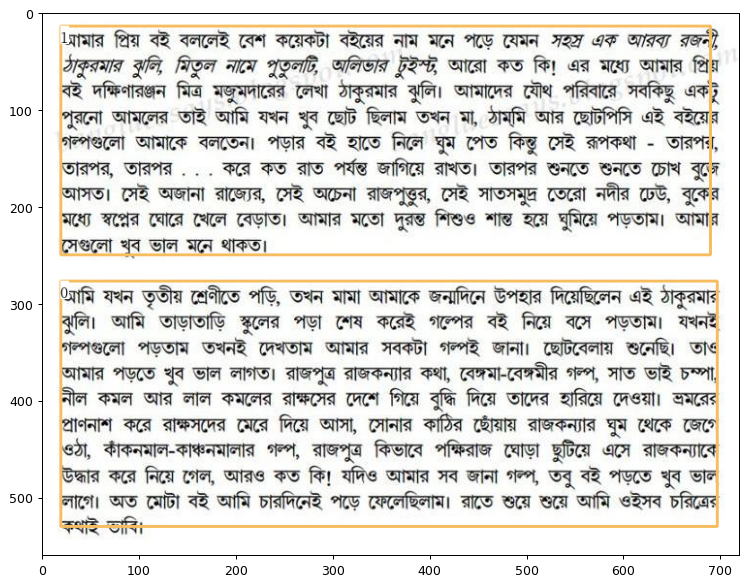

আমি যখন তৃতীয় শ্রেণীতে পড়ি, তখন মামা আমাকে জন্মদিনে উপহার দিয়েছিলেন এই ঠাকুরমার
ঝুলি। আমি তাড়াতাড়ি স্কুলের পড়া শেষ করেই গল্পের বই নিয়ে বসে পড়তাম। যখনই
গল্পগুলো পড়তাম তখনই দেখতাম আমার সবকটা গল্পই জানা। ছোটবেলায় শুনেছি। তাও
আমার পড়তে খুব ভাল লাগত। রাজপুত্র রাজকন্যার কথা, বেঙ্গমা-বেঙ্গমীর গল্প, সাত ভাই চম্পা,
নীল কমল আর লাল কমলের রাক্ষসের দেশে গিয়ে বুদ্ধি দিয়ে তাদের হারিয়ে দেওয়া। ভ্রমরের
প্রাণনাশ করে রাক্ষসদের মেরে দিয়ে আসা, সোনার কাঠির ছোয়ায় রাজকন্যার ঘুম থেকে জেগে
ওঠা, কাকনমাল-কাঞ্চনমালার গল্প, রাজপুত্র কিভাবে পক্ষিরাজ ঘোড়া ছুটিয়ে এসে রাজকন্যাকে
উদ্ধার করে নিয়ে গেল, আরও কত কি! যদিও আমার সব জানা গল্প, তবু বই পড়তে খুব ভাল
লাগে। অত মোটা বই আমি চারদিনেই পড়ে ফেলেছিলাম। রাতে শুয়ে সুয়ে আমি ওইসব চরিত্রের
math ih

---
আমার প্রিয় বই বললেই বেশ কয়েকটা বইয়ের নাম মনে পড়ে যেমন সহস্র এক আ'রবা রজনী
ঠাকুরমার ঝুলি মিতৃল নামে পুতৃলাটু আলিভার টুইস্টু আরো কত কি! এর মধ্যে আমার প্রিয
বই দক্ষিণারঞ্জন মিত্র মজুমদারের লেখা ঠাকুরমার ঝুলি। আমাদের যৌথ পরিবারে সবকিছু একটু
পুরনো আমলের তাই

/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


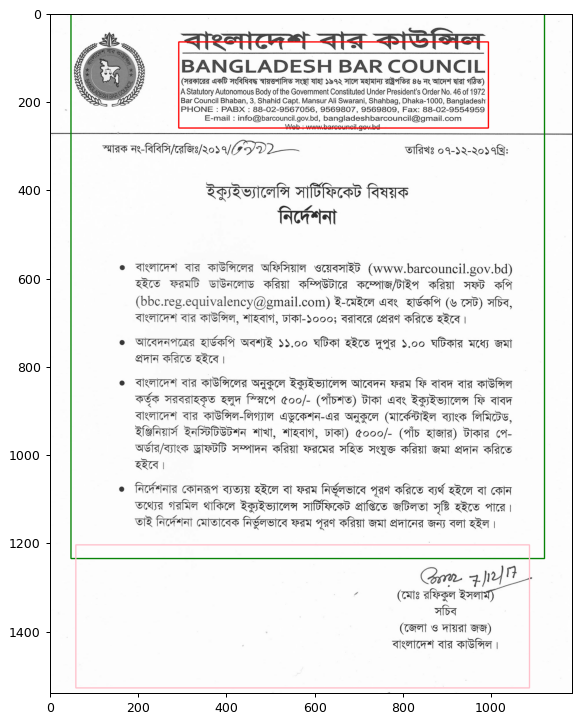

TextBlock(block=Rectangle(x_1=47.81029510498047, y_1=0.0, x_2=1119.047477722168, y_2=1235.79150390625), text=None, id=0, type=List, parent=None, next=None, score=0.48258259892463684)

plotting only text_blocks : 




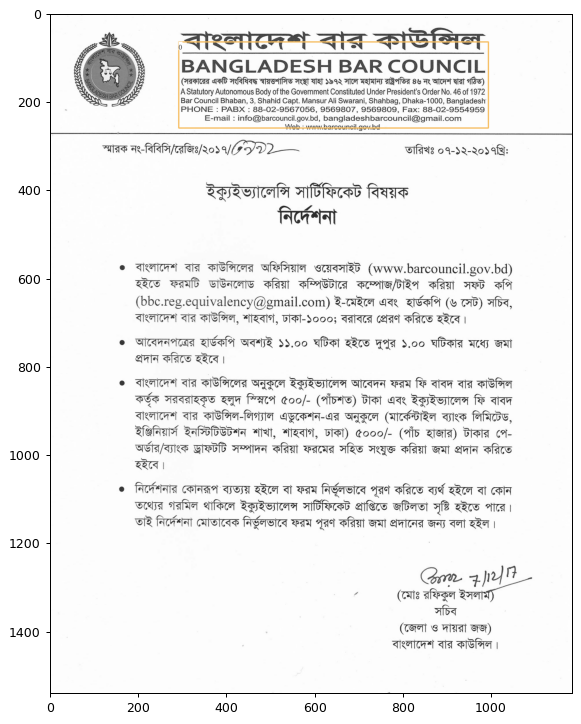

NUR UCT ONTENTS UE
BANGLADESH BAR COUNCIL

(সরকারের একটি সংবিধিবদ্ধ স্বায়ত্তশাসিত সংস্থা যাহা ১৯৭২ সালে মহামান্য রাষ্ট্রপতির ৪৬ নং আদেশ দ্বারা গঠিত)
AStatutory Autonomous Body of the Government Constituted Under President's Order No. 46 of 1972
Bar Council Bhaban, 3, Shahid Capt. Mansur Ali Swarani, Shahbag, Dhaka-1000, Bangladesh
PHONE : PABX : 88-02-9567056, 9569807, 9569809, Fax: 88-02-9554959
E-mail : info@barcouncil.gov.bd, bangladeshbarcouncil@gmail.com
ঢা nace

---
/content/document_layout_analysis/random/benlayout.jpg


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


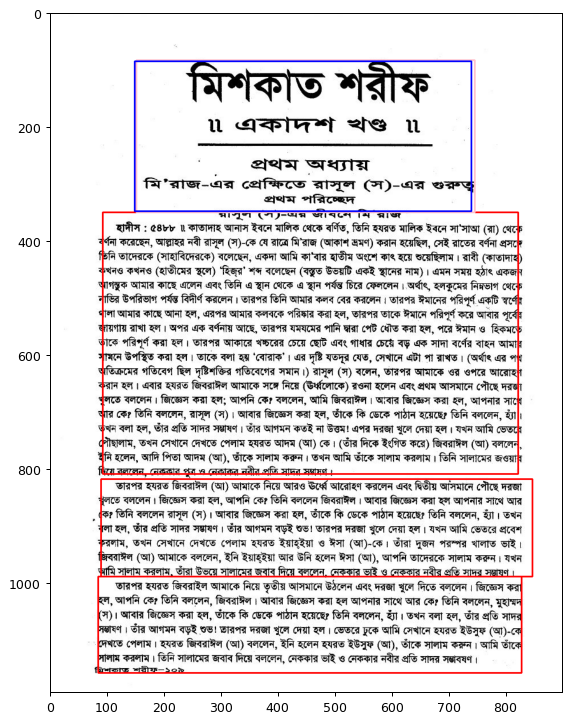

TextBlock(block=Rectangle(x_1=92.70792388916016, y_1=351.0635070800781, x_2=820.0961074829102, y_2=810.5400390625), text=None, id=0, type=Text, parent=None, next=None, score=0.9514709115028381)

plotting only text_blocks : 




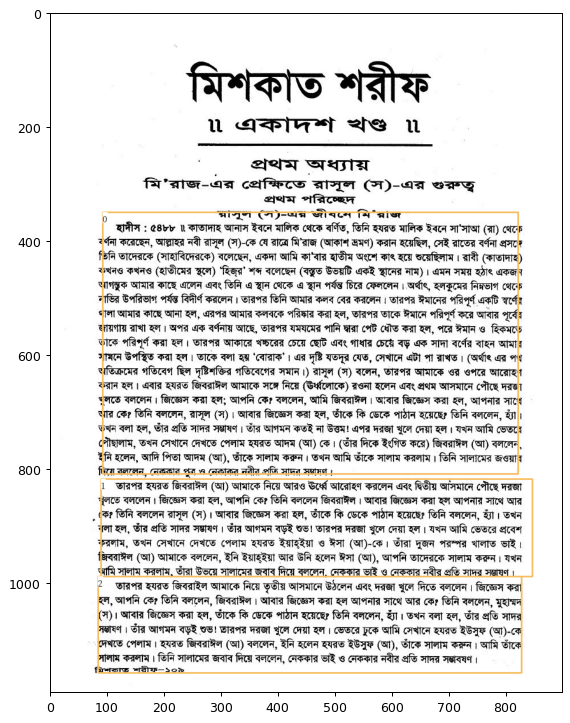

FPL সে)-এক্স জ্বলে মমি রাজ

হাদীস : ৫৪৮৮ ॥ কাতাদাহ আনাস ইবনে মালিক থেকে বর্ণিত, তিনি হযরত মালিক ইৰনে সা'সাআ (রা) থেবে
বর্ণনা করেছেন, আল্লাহর নবী রাসূল (স)-কে যে রাত্রে মি'রাজ (আকাশ ভ্রমণ) করান হয়েছিল, সেই রাতের বর্ণনা প্রসঙ্গে
তিনি তাদেরকে (সাহাবিদেরকে) বলেছেন, একদা আমি কা'বার হাতীম অংশে কাৎ হয়ে শুয়েছিলাম ৷ রাবী (কাতাদাহ
কখনও কখনও (হাতীমের স্থলে) 'হিজ্র' শব্দ বলেছেন (বস্তুত উভয়টি একই স্থানের নাম) ৷ এমন সময় হঠাৎ একজন
আগন্ুক আমার কাছে এলেন এবং তিনি এ স্থান থেকে এ স্থান পর্যন্ত চিরে ফেললেন । অর্থাৎ, হলকুমের নিম্নভাগ থেবে
নাভির উপরিভাগ পর্যন্ত বিদীর্ণ করলেন। তারপর তিনি আমার কলব বের করলেন। তারপর ঈমানের পরিপূর্ণ একটি স্বর্ণের
থালা আমার কাছে আনা হল, এরপর আমার কলবকে পরিষ্কার করা হল, তারপর তাকে ঈমানে পরিপূর্ণ করে আবার পূর্বের
সায়গায় রাখা হল । অপর এক বর্ণনায় আছে, তারপর যমযমের পানি দ্বারা পেট ধৌত করা হল, পরে ঈমান ও হিকমত
তাকে পরিপূর্ণ করা হল। তারপর আকারে খচ্চরের চেয়ে ছোট এবং গাধার চেয়ে বড় এক সাদা বর্ণের বাহন আমার
সামনে উপস্থিত করা হল। তাকে বলা হয় 'বোরাক'। এর দৃষ্টি যতদূর যেত, সেখানে এ

/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


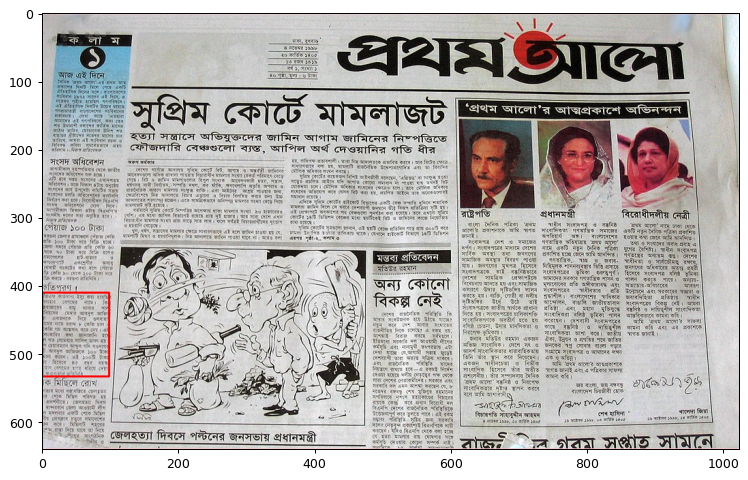

TextBlock(block=Rectangle(x_1=0.0, y_1=0.0, x_2=1024.0, y_2=640.0), text=None, id=0, type=Figure, parent=None, next=None, score=0.74534672498703)

plotting only text_blocks : 


Bengali DLU failed on this image(probably text inside figure??)...


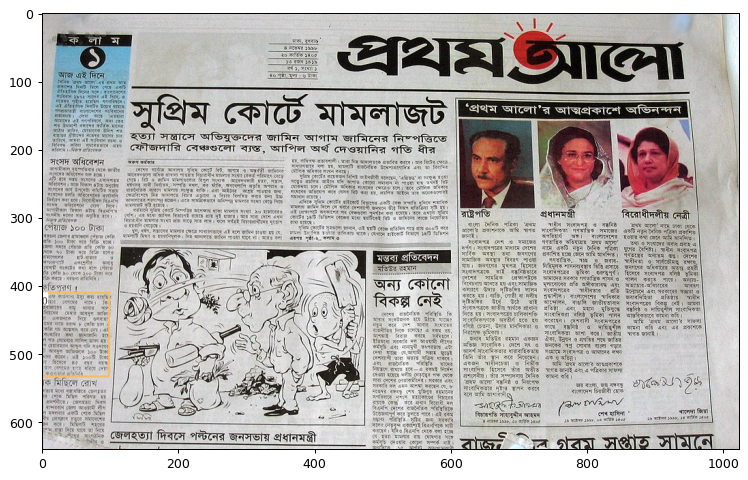

  

le

 

 

io amen a
seca ene
ও চে
লে et so

 

  

---
/content/document_layout_analysis/random/cashmemo.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


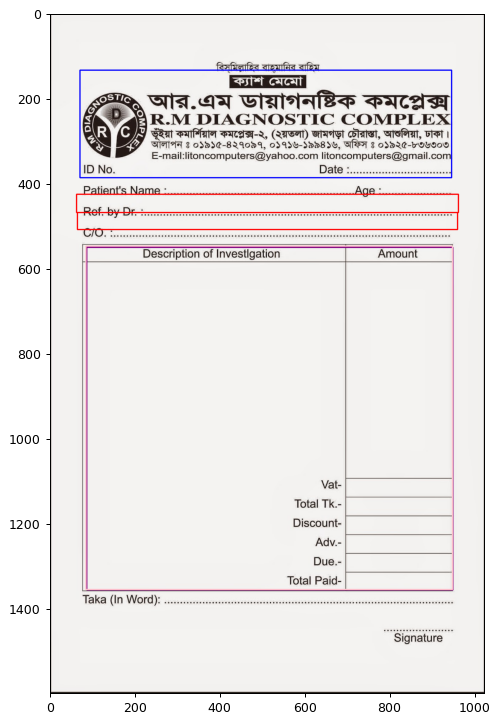

TextBlock(block=Rectangle(x_1=86.05594635009766, y_1=551.059814453125, x_2=947.5606460571289, y_2=1357.7342529296875), text=None, id=0, type=Table, parent=None, next=None, score=0.9169842600822449)

plotting only text_blocks : 




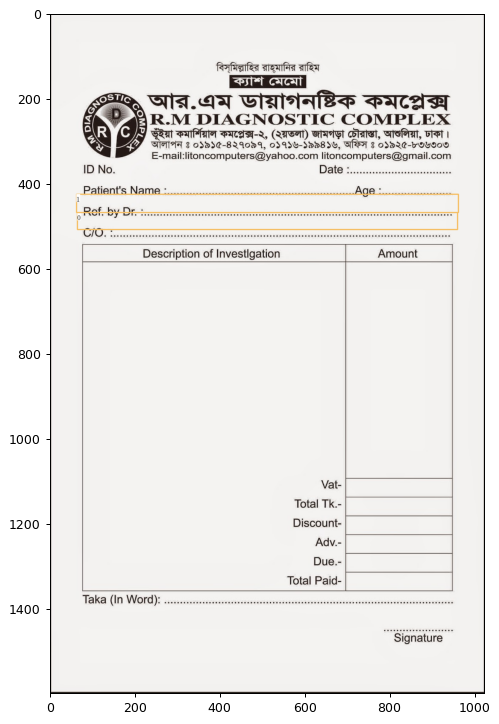

INST. VY UT.

 

=

---
   

— eo

Ref hv Nr -

---
/content/document_layout_analysis/random/testing.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


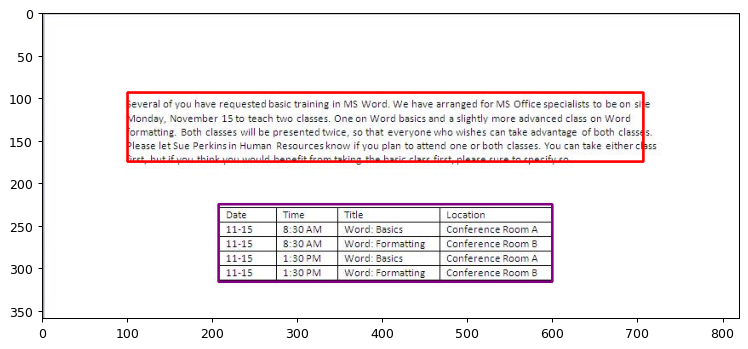

TextBlock(block=Rectangle(x_1=207.01519775390625, y_1=225.50941467285156, x_2=599.4019775390625, y_2=316.7986755371094), text=None, id=0, type=Table, parent=None, next=None, score=0.4593149721622467)

plotting only text_blocks : 




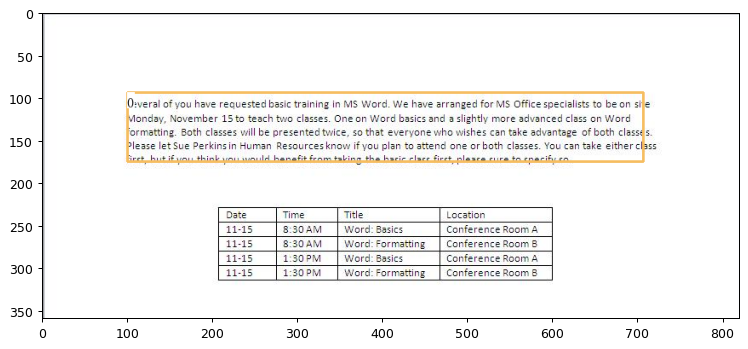

Several of you have requested basic training in MS Word. We have arranged for MS Office specialists to be on sit
Monday, November 15 to teach two classes. One on Word basics and a slightly more advanced class on Word
will be presented twice, so that everyone who wishes can take advantage of both cls

 

formatting. Both cls:
Please let Sue Perkins in Human Resources know if you plan to attend one or both classes. You can take either cl

first. bait H gous thuickk you seiskd bensebe দিদি চাও ও ৮ specdly sb.

---
/content/document_layout_analysis/sushmit_bhai/1.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


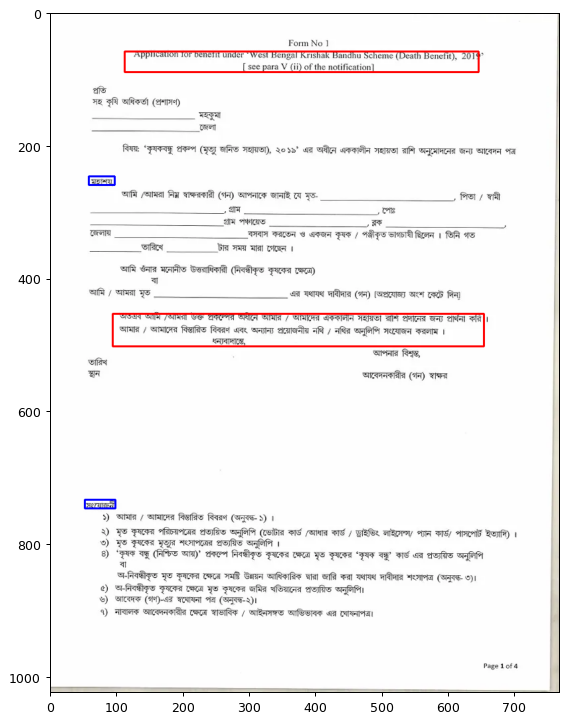

TextBlock(block=Rectangle(x_1=58.7184944152832, y_1=247.47695922851562, x_2=97.75849914550781, y_2=260.9766540527344), text=None, id=0, type=Title, parent=None, next=None, score=0.30186927318573)

plotting only text_blocks : 




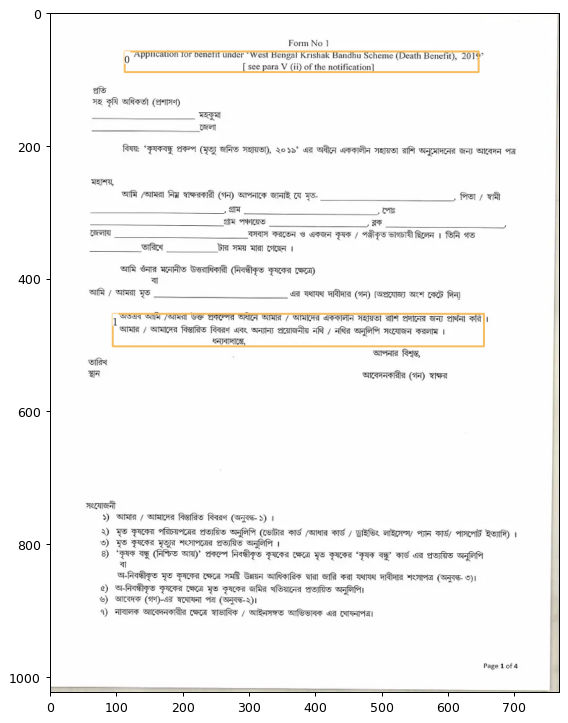

Application for benefit under “West Bengal Krishak Bandhu Scheme (Death Benefit), 2019
[see para V (ii) of the notification]

---
অতএব আমি /আমরা উক্ত প্রকল্পের অধীনে আমার / আমাদের এককালীন সহায়তা রাশি প্রদানের জন্য প্রার্থনা করি
আমার / আমাদের বিস্তারিত বিবরণ এবং অন্যান্য প্রয়োজনীয় নথি / নথির অনুলিপি সংযোজন করলাম |
STAT,

---
/content/document_layout_analysis/sushmit_bhai/2.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


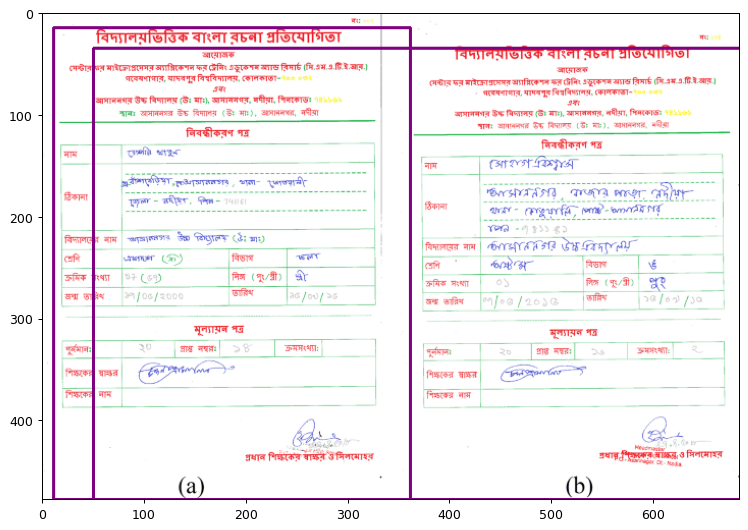

TextBlock(block=Rectangle(x_1=50.36163330078125, y_1=35.19403839111328, x_2=685.0, y_2=478.00000762939453), text=None, id=0, type=Figure, parent=None, next=None, score=0.5164334177970886)

plotting only text_blocks : 


Bengali DLU failed on this image(probably text inside figure??)...


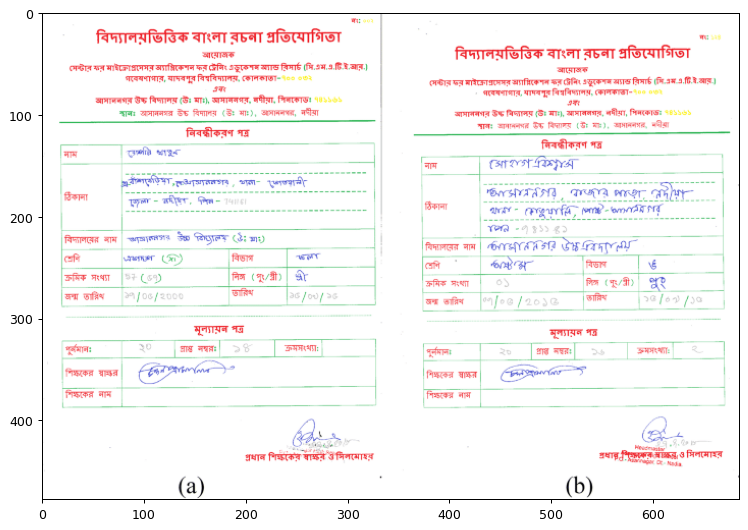

/content/document_layout_analysis/sushmit_bhai/3.png


color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


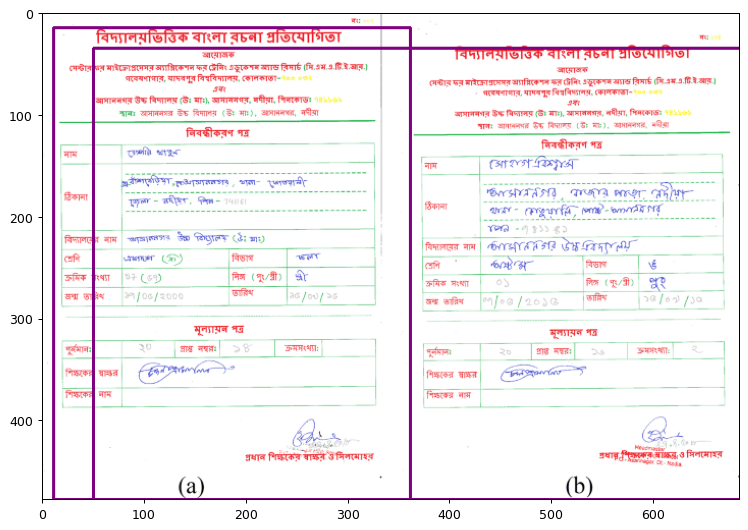

TextBlock(block=Rectangle(x_1=50.36163330078125, y_1=35.19403839111328, x_2=685.0, y_2=478.00000762939453), text=None, id=0, type=Figure, parent=None, next=None, score=0.5164334177970886)

plotting only text_blocks : 


Bengali DLU failed on this image(probably text inside figure??)...


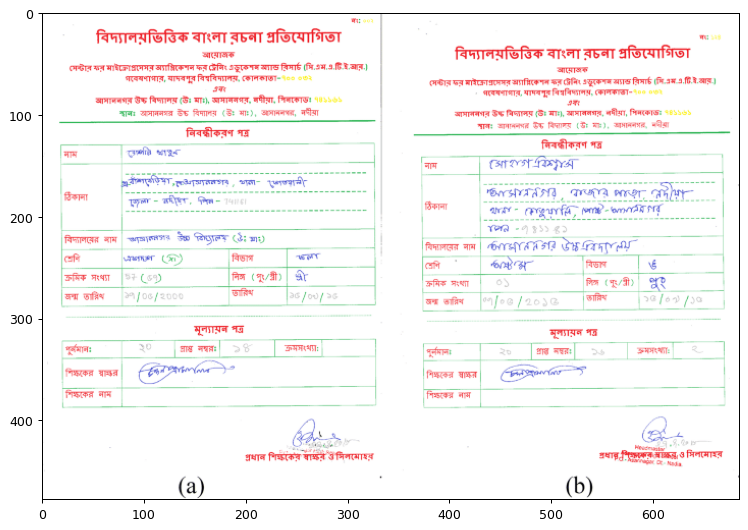

/content/document_layout_analysis/sushmit_bhai/4.png


color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


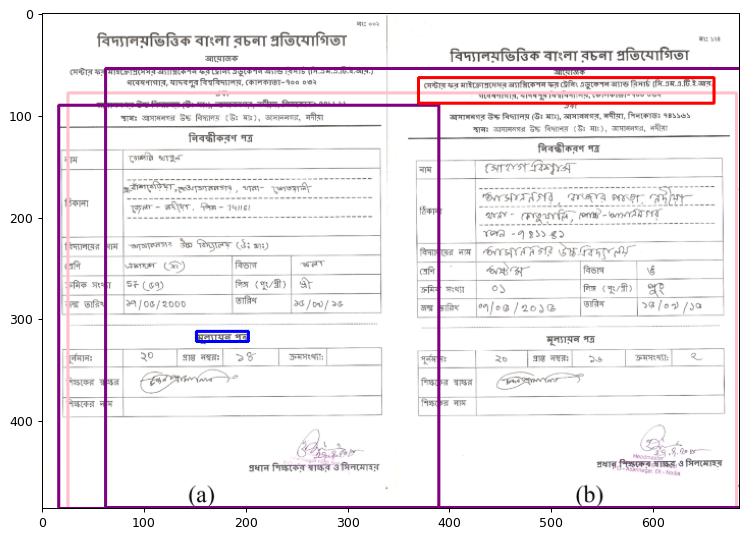

TextBlock(block=Rectangle(x_1=25.332813262939453, y_1=78.16040802001953, x_2=681.8558235168457, y_2=486.00000762939453), text=None, id=0, type=Figure, parent=None, next=None, score=0.4277464747428894)

plotting only text_blocks : 




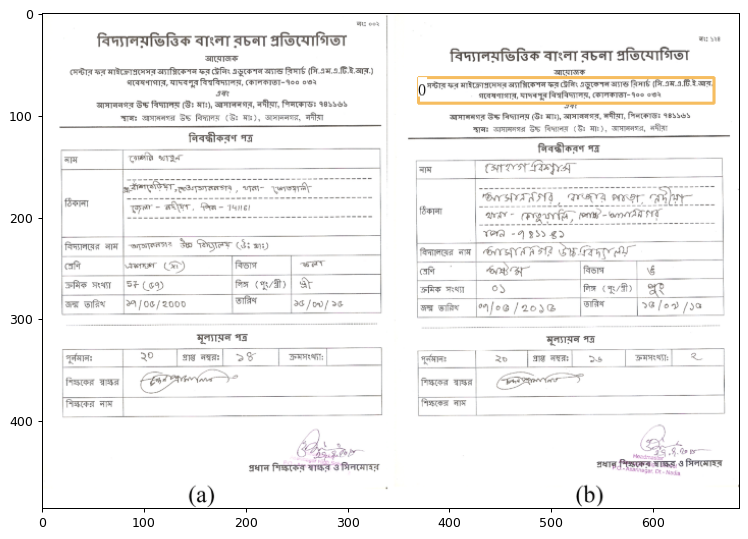

সেন্টার ফর মাকোপ্রমেদর আযাঙমিকেশন ফর সেল ETT se Peg (AE eT)
a কোলকাা-৭০০ ০৭

---
/content/document_layout_analysis/sushmit_bhai/5.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


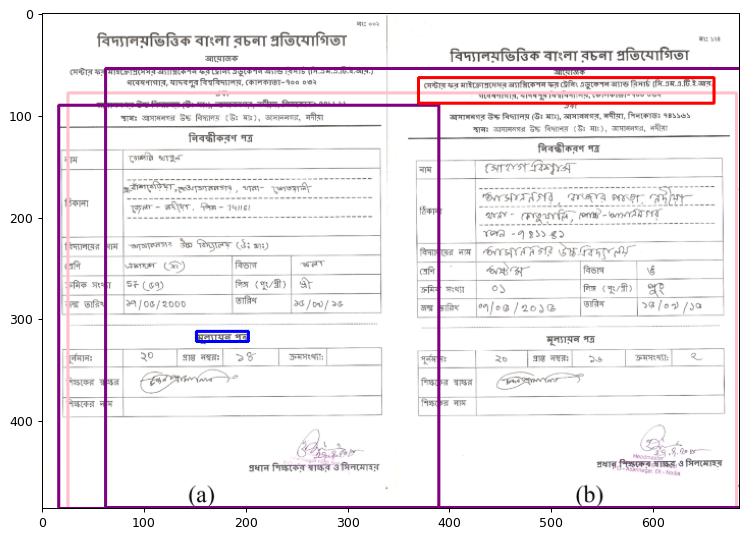

TextBlock(block=Rectangle(x_1=25.332813262939453, y_1=78.16040802001953, x_2=681.8558235168457, y_2=486.00000762939453), text=None, id=0, type=Figure, parent=None, next=None, score=0.4277464747428894)

plotting only text_blocks : 




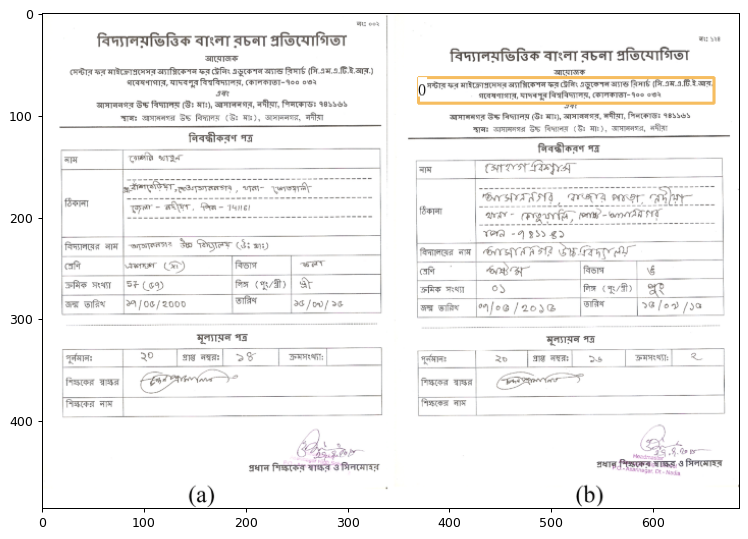

সেন্টার ফর মাকোপ্রমেদর আযাঙমিকেশন ফর সেল ETT se Peg (AE eT)
a কোলকাা-৭০০ ০৭

---
/content/document_layout_analysis/sushmit_bhai/6.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


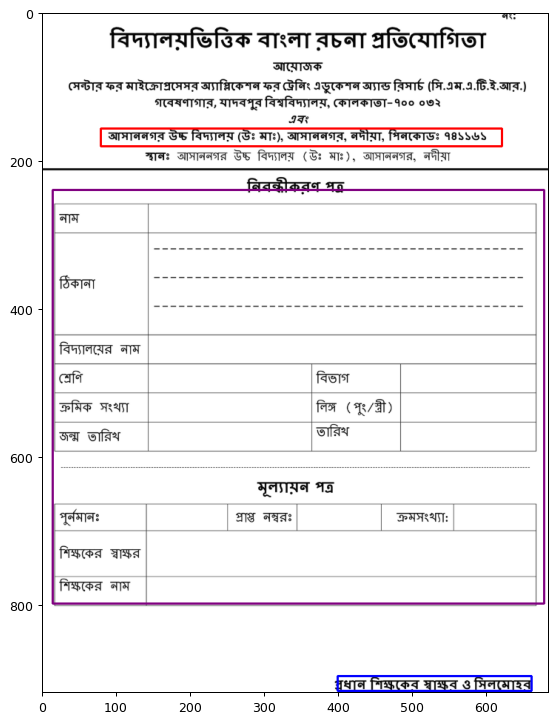

TextBlock(block=Rectangle(x_1=14.255956649780273, y_1=240.9005889892578, x_2=678.8084468841553, y_2=799.7628326416016), text=None, id=0, type=Table, parent=None, next=None, score=0.4569827914237976)

plotting only text_blocks : 




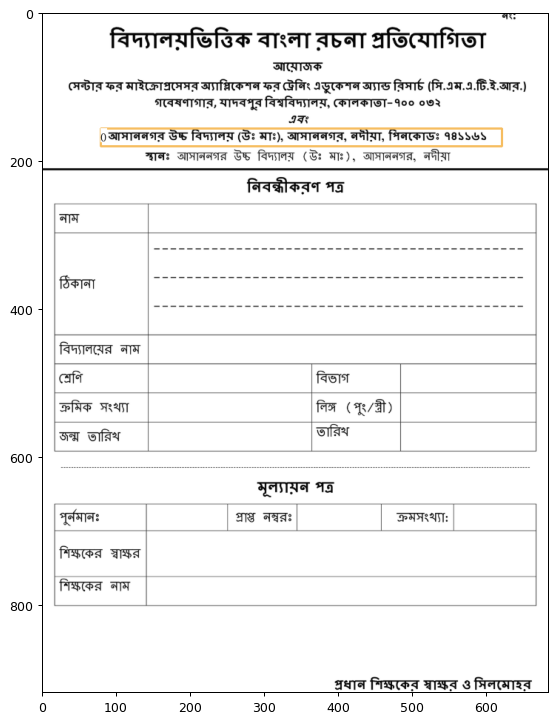

আসাননগর উচ্চ বিদ্যালয় (উঃ মাঃ), আসাননগর, নদীয়া, পিনকোডঃ ৭৪১১৬১

---
/content/document_layout_analysis/sushmit_bhai/image.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


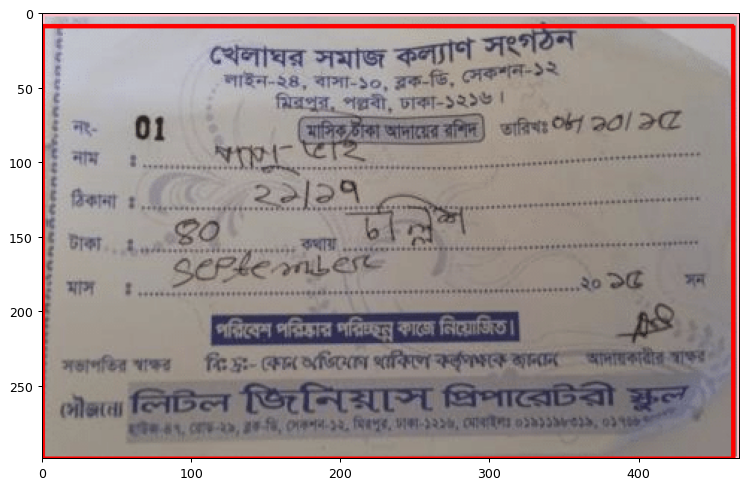

TextBlock(block=Rectangle(x_1=0.0, y_1=1.3370479345321655, x_2=467.5577087402344, y_2=299.00001180171967), text=None, id=0, type=Figure, parent=None, next=None, score=0.6934300661087036)

plotting only text_blocks : 


Bengali DLU failed on this image(probably text inside figure??)...


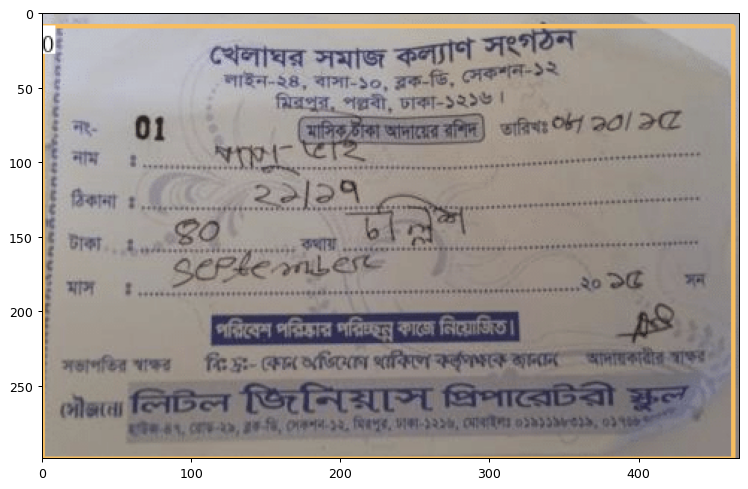

 
 
  
  
    

খেলাঘর
'লাইন-২৪. বাসা-১০, ELE, AEE OS
মিত্রপুর, পল্লবী, ঢাকা-১২১৬ ।
ial ofr Of 20/ aT
se =

1 2212,

   

---
/content/document_layout_analysis/sushmit_bhai/image1.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


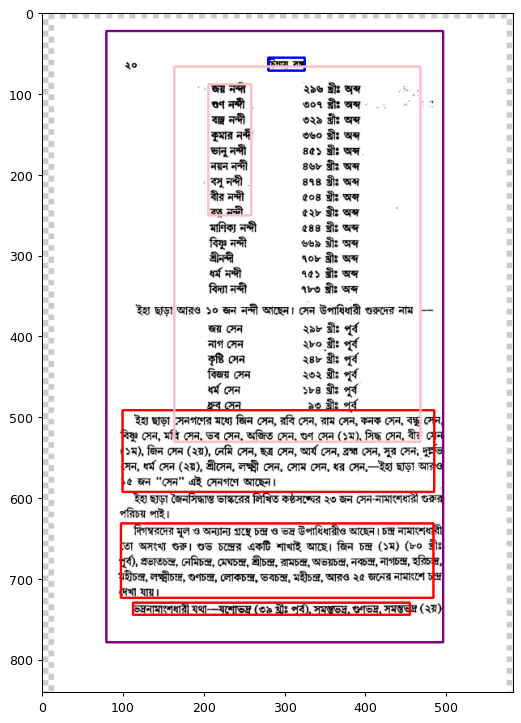

TextBlock(block=Rectangle(x_1=99.00630187988281, y_1=492.6269226074219, x_2=484.33631896972656, y_2=593.6524658203125), text=None, id=0, type=Text, parent=None, next=None, score=0.41666483879089355)

plotting only text_blocks : 




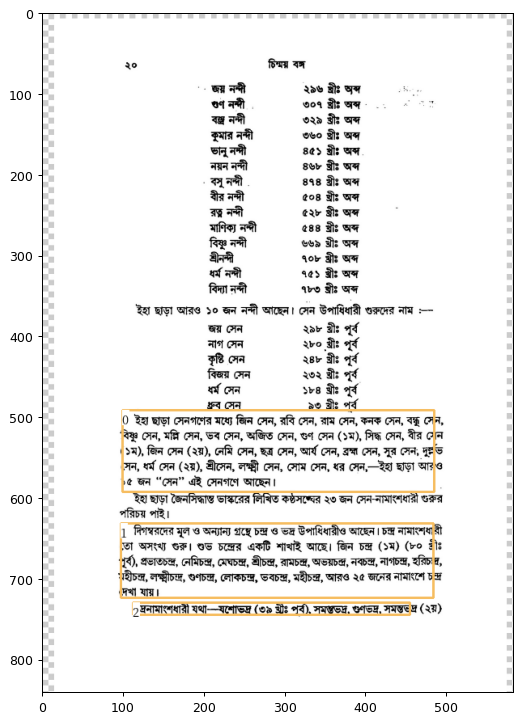

'ইহা ছাড়া সেনগণের মধ্যে জিন সেন, রবি সেন, রাম সেন, কনক সেন, বন্ধু সেন
বিষ্ণু সেন, মন্লি সেন, ভব সেন, অজিত সেন, গুণ সেন (১ম), সিদ্ধ সেন, বীর সে
(১ম), জিন সেন (য়), নেমি সেন, ছত্র সেন, আর্য সেন, ব্রহ্ম সেন, সুর সেন, দুর
সেন, ধর্ম সেন (২য়), শ্রীসেন, লক্ষ্মী সেন, সোম সেন, ধর সেন, -_ইহা ছাড়া আর'
১৫ জন “সেন” এই সেনগণে আছেন।

---
দিগম্বরদের মূল ও অন্যান্য গ্রছে চন্দ্র ও ভদ্র উপাধিধারীও আছেন। চন্দ্র নামাংশধা'
তো অসংখ্য গুরু। শুভ চন্দ্রের একটি শাখাই আছে। জিন চন্দ্র (১ম) (৮০ শ্রী
abu, THOU, Oe, ATTY, SAE, TIS, GIG Ae GAA ATIC Be
দেখা যায়।

---
'ভদ্রনামাংশধারী যথা---যশোভদ্র (৩৯ স্রীঃ পূর্ব), সমস্তভদ্র, গুণভদ্র, সমস্তভং

---
/content/document_layout_analysis/sushmit_bhai/image2.png


/usr/local/lib/python3.7/dist-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes




color_map : 

 {'Text': 'red', 'Title': 'blue', 'List': 'green', 'Table': 'purple', 'Figure': 'pink'}


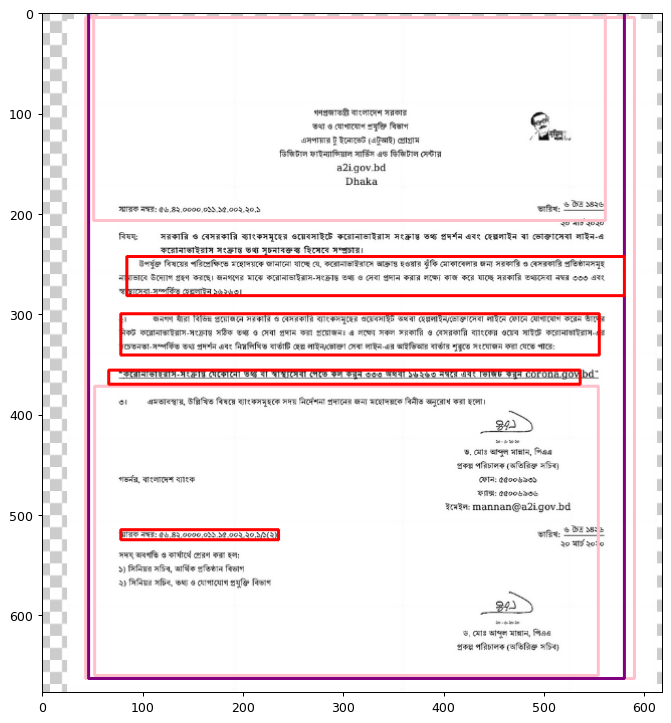

TextBlock(block=Rectangle(x_1=51.20381546020508, y_1=0.0, x_2=560.826099395752, y_2=207.88446044921875), text=None, id=0, type=Figure, parent=None, next=None, score=0.522472620010376)

plotting only text_blocks : 


Bengali DLU failed on this image(probably text inside figure??)...


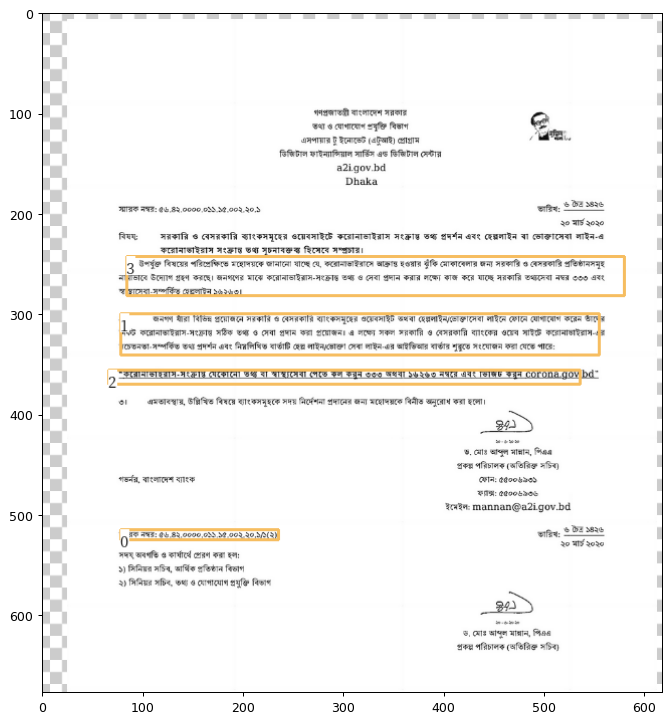

স্মারক নম্বর: ৫৬.৪২,০০০০,০১১.১৫/০০২.২০.১০(২)

---
'২। জনগণ ধরা বিভি প্রয়োজনে সরকারি ও বেসরকারি ব্যাংকসমুহের ওয়েবসাইট তথবা ছেপললাইন/লেক্াসেবা লাইনে ফোনে যোগাযোগ করেন জানেন
fe one TE সক কয ও সেবা RR BH প্রয়োজন! এ লক্ষে সকল সরকারি ও বেসরকারি ব্যাংকের OC TE ENE
জনা সমপ্ষিত ভা প্রদন এষং Se EB ee Fe wR Re যায পুতে সংযোজন কলা বেডে খাছ

 

---
 

 

 

 

 

 

 

---
 

fe Pecan rece rare wre ec, করোলাভাইযাসে অক হওয়ার বু মোকাবেলার জনা সরকারি ও বেসরকারি প্রতিষ্ঠানসমূহ
Ie ST LEN SE AMIE IE ATTACH we oe প্রদান করার লক্ষে কাজ করে াচ্ছে সরকারি তথযদেবা নর ৩০৬ এবং
COE ER GONE ১৬২৬৩)

---


In [11]:
for i in range(len(test_images)):
  bengali_doc_layout_parser(image_path = test_images[i],model_name = 'efficientdet')

# Detectron2

In [12]:
# for i in range(len(test_images)):
#   bengali_doc_layout_parser(image_path = test_images[i],model_name = 'Detectron2')

# For custom training,we can use : https://github.com/Layout-Parser/layout-model-training

#Table parsing using tesseract

this tutorial : https://github.com/Layout-Parser/layout-parser/blob/master/examples/OCR%20Tables%20and%20Parse%20the%20Output.ipynb used Google Cloud Vision api which can't be used without having access credentials, here we will give TesseractAgent a try instead for table parsing

In [13]:
ocr_agent = lp.TesseractAgent(languages='eng+ben') 

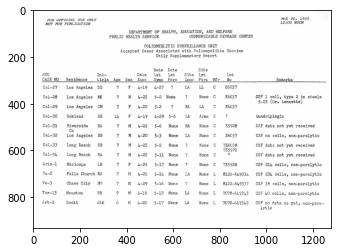

In [14]:
image = cv2.imread('/content/table1.jpeg')
plt.imshow(image);

In [15]:
res = ocr_agent.detect(image, return_response=True)

In [16]:

layout  = ocr_agent.gather_data(res, agg_level=lp.TesseractFeatureType.WORD) 


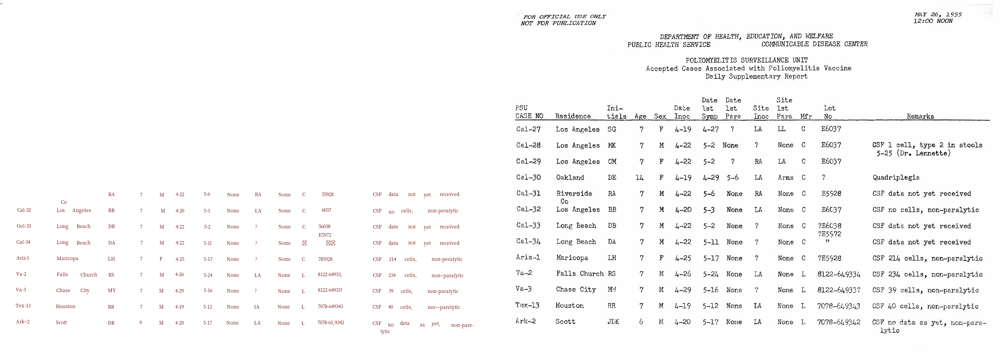

In [17]:
lp.draw_text(image, layout, font_size=12, with_box_on_text=True,
             text_box_width=1)

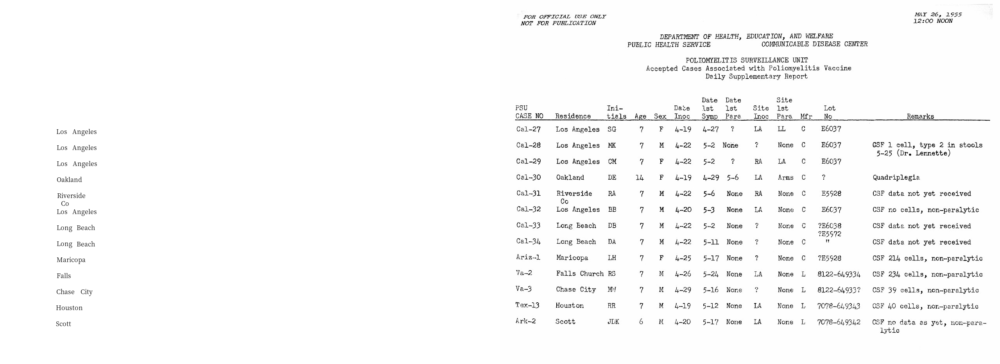

In [18]:
filtered_residence = layout.filter_by(
    lp.Rectangle(x_1=132, y_1=300, x_2=264, y_2=840)
)
lp.draw_text(image, filtered_residence, font_size=16)

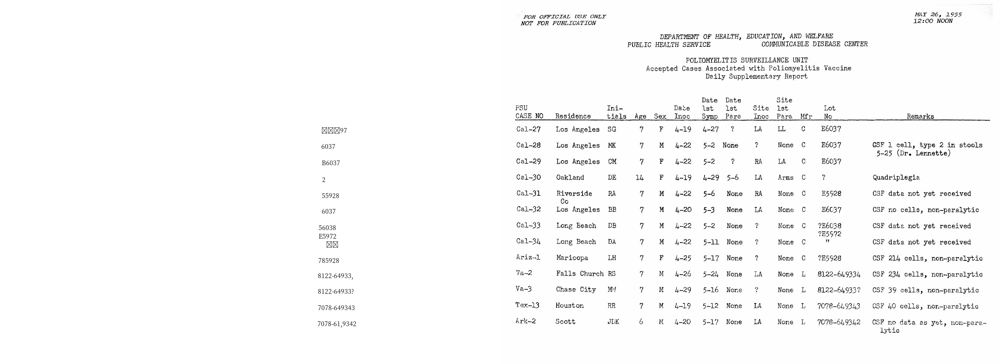

In [19]:
filter_lotno = layout.filter_by(
    lp.Rectangle(x_1=810, y_1=300, x_2=910, y_2=840),
    soft_margin = {"left":10, "right":20} # Without it, the last 4 rows could not be included
)
lp.draw_text(image, filter_lotno, font_size=16)

In [20]:
y_0 = 307
n_rows = 13
height = 41
y_1 = y_0+n_rows*height

row = []
for y in range(y_0, y_1, height):
    
    interval = lp.Interval(y,y+height, axis='y')
    residence_row = filtered_residence.\
        filter_by(interval).\
        get_texts()

    lotno_row = filter_lotno.\
        filter_by(interval).\
        get_texts()
    
    row.append([''.join(residence_row), ''.join(lotno_row)])

In [21]:
row

[['LosAngeles', '৪০০97'],
 ['LosAngeles', '6037'],
 ['LosAngeles', 'B6037'],
 ['Oakland', '2'],
 ['Riverside', '55928'],
 ['LosAngeles', '6037'],
 ['LongBeach', '56038'],
 ['LongBeach', 'রগ'],
 ['Maricopa', '785928'],
 ['Falls', '8122-64933,'],
 ['ChaseCity', '8122-64933?'],
 ['Houston', '7078-649343'],
 ['Scott', '7078-61,9342']]

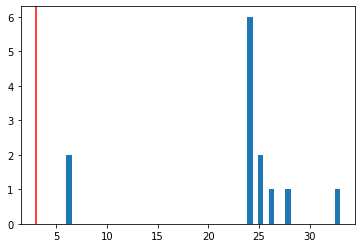

In [22]:
blocks = filter_lotno

blocks = sorted(blocks, key = lambda x: x.coordinates[1])
    # Sort the blocks vertically from top to bottom 
distances = np.array([b2.coordinates[1] - b1.coordinates[3] for (b1, b2) in zip(blocks, blocks[1:])])
    # Calculate the distances: 
    # y coord for the upper edge of the bottom block - 
    #   y coord for the bottom edge of the upper block
    # And convert to np array for easier post processing
plt.hist(distances, bins=50);
plt.axvline(x=3, color='r');
    # Let's have some visualization 

In [23]:
distance_th = 0

distances = np.append([0], distances) # Append a placeholder for the first word
block_group = (distances>distance_th).cumsum() # Create a block_group based on the distance threshold 

block_group

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

In [24]:
# Group the blocks by the block_group mask 
grouped_blocks = [[] for i in range(max(block_group)+1)]
for i, block in zip(block_group, blocks):
    grouped_blocks[i].append(block) 

In [25]:
def group_blocks_by_distance(blocks, distance_th):

    blocks = sorted(blocks, key = lambda x: x.coordinates[1])
    distances = np.array([b2.coordinates[1] - b1.coordinates[3] for (b1, b2) in zip(blocks, blocks[1:])])

    distances = np.append([0], distances)
    block_group = (distances>distance_th).cumsum()

    grouped_blocks = [lp.Layout([]) for i in range(max(block_group)+1)]
    for i, block in zip(block_group, blocks):
        grouped_blocks[i].append(block) 
        
    return grouped_blocks

In [26]:
A = group_blocks_by_distance(filtered_residence, 5)
B = group_blocks_by_distance(filter_lotno, 10) 

# And finally we combine the outputs 
height_th = 30
idxA, idxB = 0, 0

result = []
while idxA < len(A) and idxB < len(B):
    ay = A[idxA][0].coordinates[1]
    by = B[idxB][0].coordinates[1]
    ares, bres = ''.join(A[idxA].get_texts()), ''.join(B[idxB].get_texts())
    if abs(ay - by) < height_th:
        idxA += 1; idxB += 1
    elif ay < by:
        idxA += 1; bres = ''
    else: 
        idxB += 1; ares = ''
    result.append([ares, bres])
    
result

[['LosAngeles', '৪০০97'],
 ['LosAngeles', '6037'],
 ['LosAngeles', 'B6037'],
 ['Oakland', '2'],
 ['Riverside', '55928'],
 ['Co', '6037'],
 ['LosAngeles', ''],
 ['LongBeach', '56038E5972রগ'],
 ['LongBeach', ''],
 ['Maricopa', '785928'],
 ['Falls', '8122-64933,'],
 ['ChaseCity', '8122-64933?'],
 ['Houston', '7078-649343'],
 ['Scott', '7078-61,9342']]

In [27]:
df = pd.DataFrame(row, columns=['residence', 'lot no'])
df

,residence,lot no
0,LosAngeles,৪০০97
1,LosAngeles,6037
2,LosAngeles,B6037
3,Oakland,2
4,Riverside,55928
5,LosAngeles,6037
6,LongBeach,56038
7,LongBeach,রগ
8,Maricopa,785928
9,Falls,"8122-64933,"
